# (Recap) Basic Data Gathering
(state of the code after session 1; pasted in here because we can't easily include between notebooks)

In [90]:
import sys
!{sys.executable} -m pip install gitpython
!{sys.executable} -m pip install pyvis

In [91]:
# all the needed imports
import os
import sys
import re

import pathlib
from pathlib import Path

import networkx as nx
import matplotlib.pyplot as plt

from git import Repo

In [92]:
cwd = os.getcwd()
print(cwd)


/Users/christianlauridsen/Documents/ITU/MSc/semester-2/Software-Architecture/architectural-reconstruction


In [93]:
# Let's declare a var for the path where we're going to download a repository
# Warning: this must end in /
CODE_ROOT_FOLDER=cwd+"/content/zeeguu-api/"


In [94]:
from git import Repo
# GitPython is a library that allows us to work easily with git from Python
# https://gitpython.readthedocs.io/en/stable/tutorial.html


# If the file exists, it means we've already downloaded
if not os.path.exists(CODE_ROOT_FOLDER):
  Repo.clone_from("https://github.com/zeeguu/api", CODE_ROOT_FOLDER)

In [95]:
repo = Repo(CODE_ROOT_FOLDER)

In [96]:
# utility functions used later

# full path to the file given a relative file_name
def file_path(file_name):
    return CODE_ROOT_FOLDER+file_name


In [97]:
# extracting a module name from a file name
def module_name_from_file_path(full_path):

    # e.g. ../core/model/user.py -> zeeguu.core.model.user

    file_name = full_path[len(CODE_ROOT_FOLDER):]
    file_name = file_name.replace("/__init__.py","")
    file_name = file_name.replace("/",".")
    file_name = file_name.replace(".py","")
    return file_name

assert 'zeeguu.core.model.user' == module_name_from_file_path(file_path('zeeguu/core/model/user.py'))

In [ ]:
# naïve way of extracting imports using regular expressions
import re


# we assume that imports are always at the
# TODO for you: add full support for imports; this is not complete...
def import_from_line(line):

    # regex patterns used
    #   ^  - beginning of line
    #   \S - anything that is not space
    #   +  - at least one occurrence of previous
    #  ( ) - capture group (read more at: https://pynative.com/python-regex-capturing-groups/)
    try:
      y = re.search("^from (\S+)", line)
      if not y:
        y = re.search("^import (\S+)", line)
      return y.group(1)
    except:
      return None


# extracts all the imported modules from a file
# returns a module of the form zeeguu_core.model.bookmark, e.g.
def imports_from_file(file):

    all_imports = []

    lines = [line for line in open(file)]

    for line in lines:
        imp = import_from_line(line)

        if imp:
            all_imports.append(imp)

    return all_imports

imports_from_file(file_path('zeeguu/core/model/user.py'))

<>:15: SyntaxWarning: invalid escape sequence '\S'
<>:17: SyntaxWarning: invalid escape sequence '\S'
<>:15: SyntaxWarning: invalid escape sequence '\S'
<>:17: SyntaxWarning: invalid escape sequence '\S'
/var/folders/qz/g8cr90mj3rn1zcl7111g7lkm0000gn/T/ipykernel_29617/1594463815.py:15: SyntaxWarning: invalid escape sequence '\S'
  y = re.search("^from (\S+)", line)
/var/folders/qz/g8cr90mj3rn1zcl7111g7lkm0000gn/T/ipykernel_29617/1594463815.py:17: SyntaxWarning: invalid escape sequence '\S'
  y = re.search("^import (\S+)", line)


['datetime',
 'json',
 'random',
 're',
 'sqlalchemy.orm',
 'zeeguu.core',
 'sqlalchemy',
 'sqlalchemy.orm',
 'sqlalchemy.orm.exc',
 'zeeguu.core.language.difficulty_estimator_factory',
 'zeeguu.core.model.language',
 'zeeguu.core.model.learning_cycle',
 'zeeguu.logging',
 'zeeguu.core.util',
 'zeeguu.core.model',
 'zeeguu.logging']

In [ ]:
def module_from_file_path(folder_prefix, full_path):
    # extracting a module from a file name
    # e.g. ../zeeguu_core/model/user.py -> zeeguu_core.model.user
    
    file_name = full_path[len(folder_prefix):]
    file_name = file_name.replace("/",".")
    file_name = file_name.replace(".py","")
    return file_name

def module(full_path):
    return module_from_file_path(CODE_ROOT_FOLDER, full_path)

assert 'zeeguu_core.model.user' == module(file_path('zeeguu_core/model/user.py'))

In [ ]:
import pathlib
from pathlib import Path
import networkx as nx

def dependencies_graph(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.Graph()

    for file in files:
        file_path = str(file)

        module_name = module_name_from_file_path(file_path)

        if module_name not in G.nodes:
            G.add_node(module_name)

        for each in imports_from_file(file_path):
            G.add_edge(module_name, each)

    return G

In [ ]:
import matplotlib.pyplot as plt

# a function to draw a graph
def draw_graph(G, size, **args):
    plt.figure(figsize=size)
    nx.draw_kamada_kawai(G, **args)
    plt.show()

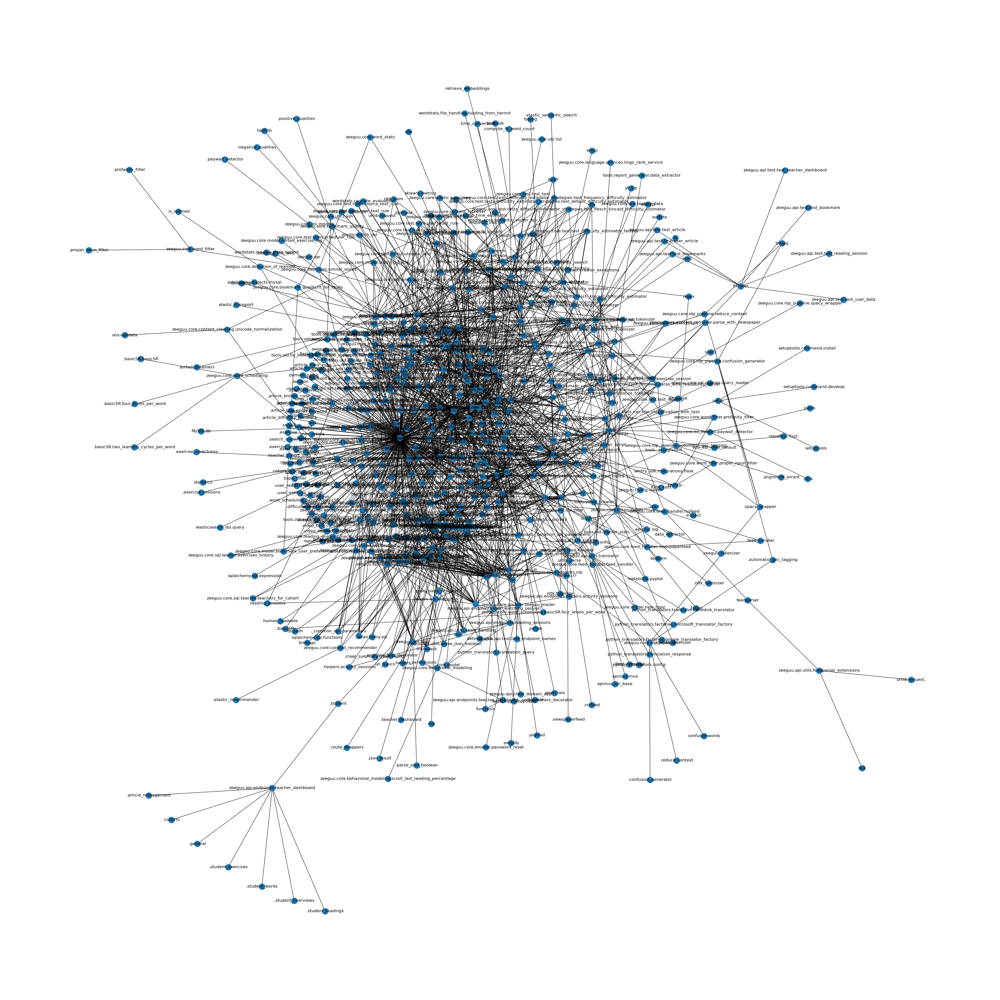

In [ ]:
G = dependencies_graph(CODE_ROOT_FOLDER)
draw_graph(G, (40,40), with_labels=True)

# Basic Abstraction/Knowledge-Inference

In [ ]:
# Let's define some relevant modules
def relevant_module(module_name):

  if "test" in module_name:
    return False


  if module_name.startswith("zeeguu"):
    return True


  return False

In [ ]:
# However, if we think a bit more about it, we realize that a dependency graph
# is a directed graph (e.g. module A depends on m)
# with any kinds of graph either directed (nx.DiGraph) or
# non-directed (nx.Graph)

def dependencies_digraph(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

            if relevant_module(target_module):
              G.add_edge(source_module, target_module)


    return G


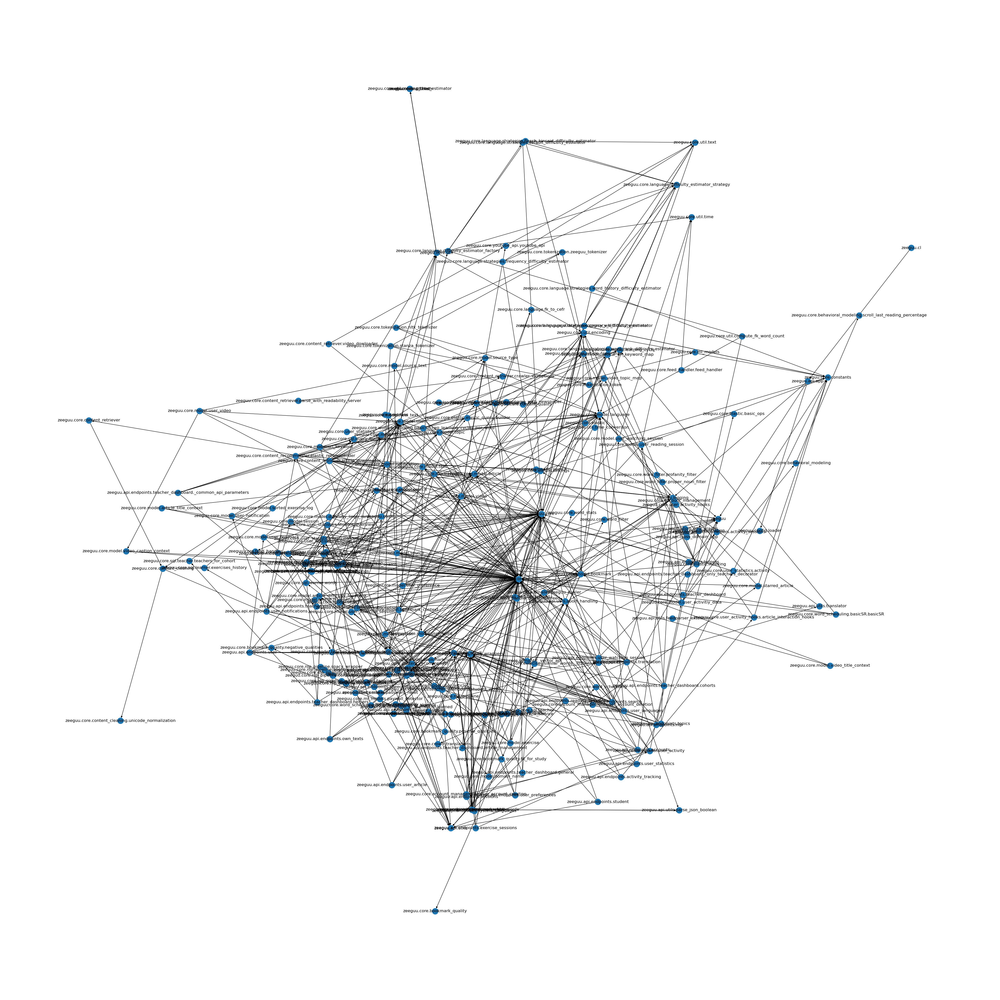

In [ ]:
# Looking at the directed graph
DG = dependencies_digraph(CODE_ROOT_FOLDER)
draw_graph(DG, (40,40), with_labels=True)

## Basic Abstraction Using Hierarchical Module Structure & Naming Conventions
* abstracting the imports between the modules along the module hierarchy
* also taking into account naming conventions to filter out external modules

In [ ]:
# extracts the parent of depth X
def top_level_package(module_name, depth=1):
    components = module_name.split(".")
    return ".".join(components[:depth])

assert (top_level_package("zeeguu.core.model.util", 1) == "zeeguu")
assert (top_level_package("zeeguu.core.model.util", 2) == "zeeguu.core")

In [ ]:
def abstracted_to_top_level(G, depth=1):
    aG = nx.DiGraph()
    for each in G.edges():
        src = top_level_package(each[0], depth)
        dst = top_level_package(each[1], depth)

        if src != dst:
          aG.add_edge(src, dst)

    return aG

In [ ]:
ADG = abstracted_to_top_level(DG, 3)

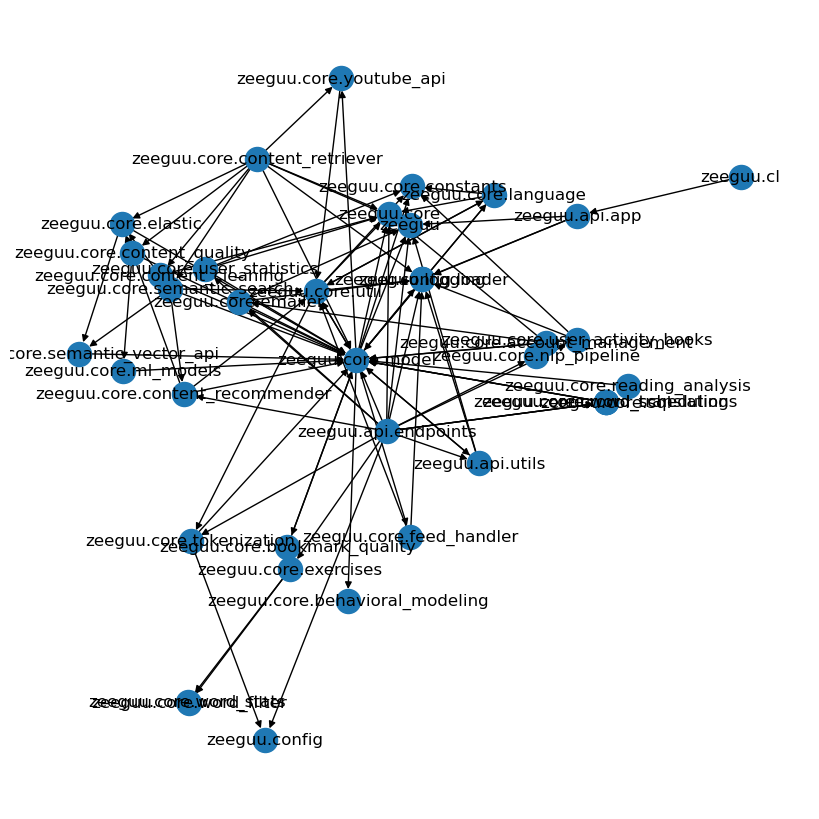

In [ ]:
draw_graph(ADG, (8,8), with_labels=True)

## Abstracting Dependencies Between Modules

Let us abstract away the details of calls between files 
to the level of the top level modules. 

To do this we have to map every python file to a top level module.

In [ ]:
"""
    Extracts the parent of depth X 
    e.g. 
      top_level_module(zeeguu_core.model.util, 1) -> zeeguu_core

"""
def top_level_module(module_name, depth=1):
    components = module_name.split(".")
    return ".".join(components[:depth])

assert (top_level_module("zeeguu_core.model.util") == "zeeguu_core")
assert (top_level_module("zeeguu_core.model.util", 2) == "zeeguu_core.model")

In [ ]:
""" 
    Returns a new graph that only has top level 
    modules and dependencies between them
"""
def abstracted_to_top_level(G):
    aG = nx.Graph()
    for each in G.edges():
        # TODO: remove self-dependencies
        aG.add_edge(top_level_module(each[0]),
                    top_level_module(each[1]))
    return aG

In [ ]:
def draw_graph_with_labels(G, figsize=(10,10)):
    plt.figure(figsize=figsize)
    nx.draw(G, with_labels=True)
    plt.show()

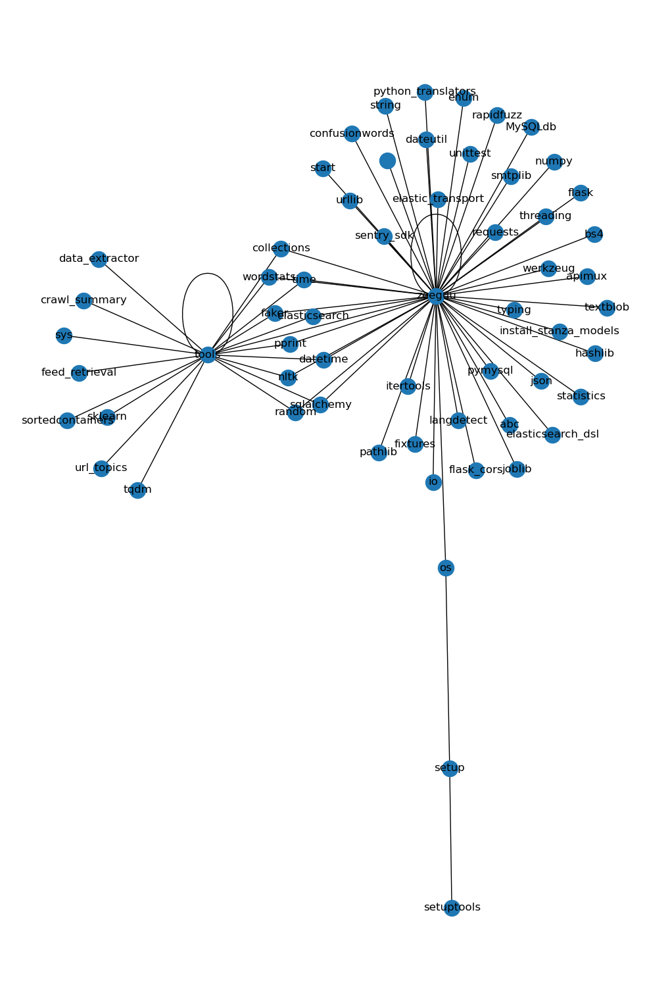

In [ ]:
G = dependencies_graph()
aG = abstracted_to_top_level(G)
draw_graph_with_labels(aG, (10,15))

### Problem: We're showing too many 3rd party dependencies

Let us only add to the graph those modules that are defined in our system.
Heuristic: their name starts with zeeguu.

In [ ]:
def is_system_module(m):
    return m.startswith('zeeguu')

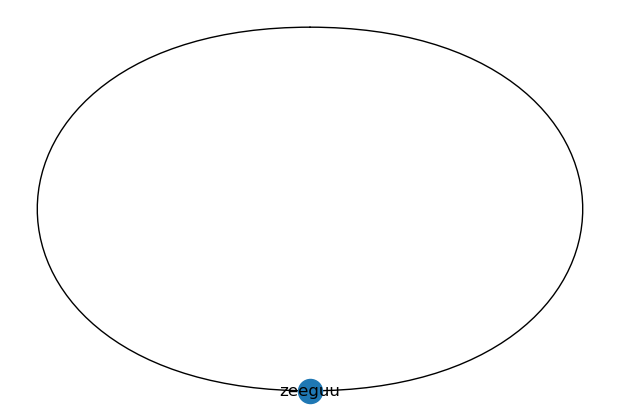

In [ ]:
def abstracted_to_top_level(G):
    aG = nx.Graph()
    for each in G.edges():
        source = top_level_module(each[0])
        destination = top_level_module(each[1])
        if is_system_module(source) and is_system_module(destination):
            aG.add_edge(source, destination)
    return aG

G = dependencies_graph()
aG = abstracted_to_top_level(G)
draw_graph_with_labels(aG, (6,4))    

### Problem: Our graph edges do not have directionality.

We don't know if test depends on core, or the other way around. 
Let's start using the `DiGraph` class from `networkx`.

In [ ]:
def dependencies_graph():
    files = Path(CODE_ROOT_FOLDER).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        m = module(str(file))
        if m not in G.nodes:
            G.add_node(m)

        for each in imports(str(file)):
            G.add_edge(m, each)

    return G

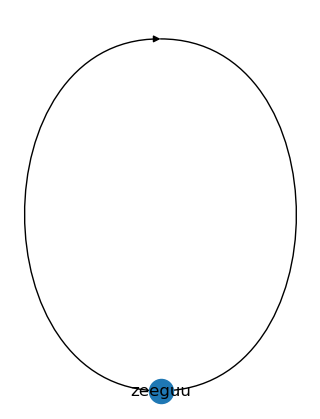

In [ ]:
def abstracted_to_top_level(G):
    aG = nx.DiGraph()
    for each in G.edges():
        source = top_level_module(each[0])
        destination = top_level_module(each[1])
        if is_system_module(source) and is_system_module(destination):
            aG.add_edge(source, destination)
    return aG

directed = dependencies_graph()
directedAbstracted = abstracted_to_top_level(directed)
draw_graph_with_labels(directedAbstracted, (3,4))    

OOps!! Something unexpected.
Core should not depend on API!

### But we know that there are other Top Level Modules that do not start with zeeguu: e.g. 'tools' or 'playground'

In [ ]:
# we redefine the system modules
def is_system_module(m):
    return m.startswith('zeeguu') or m=='tools' or m=='playground'

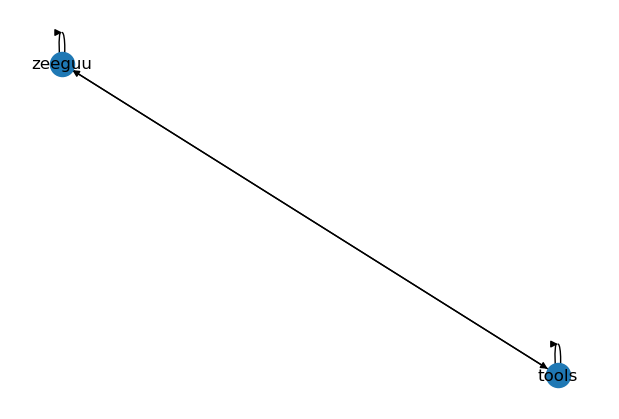

In [ ]:
# then we redraw
directed = dependencies_graph()
directedAbstracted = abstracted_to_top_level(directed)
draw_graph_with_labels(directedAbstracted, (6,4))

## Abstracting Module Properties

- simplest property: size in LOC

In [ ]:
# the simplest possible code metric
def LOC(file):
    return sum([1 for line in open(file)])


def module_size(m):
    size = 0
    files = Path(CODE_ROOT_FOLDER).rglob("*.py")
    for file in files:
        module_name = module(str(file))
        if module_name.startswith(m + '.'):
            size += LOC(str(file))
            
    return size

module_size("zeeguu_core")
module_size("zeeguu_core_test")
module_size("zeeguu_api")


0

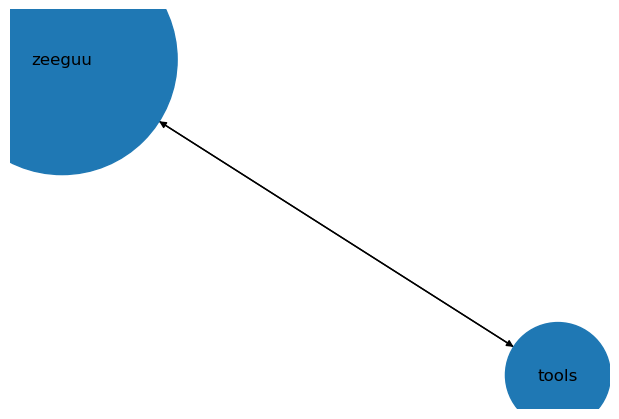

In [ ]:
def draw_graph_with_weights(G, weight_function, figsize=(10,10)):
    
    node_weights = [weight_function(each) for each in G.nodes]
    
    plt.figure(figsize=figsize)
    nx.draw(G,
            with_labels=True,
            node_size=node_weights)
    plt.show()

directed = dependencies_graph()
directedAbstracted = abstracted_to_top_level(directed)
draw_graph_with_weights(directedAbstracted, module_size, (6,4))    